In [6]:
# import twint
# import nest_asyncio
import datetime
import pandas as pd
import json

In [8]:
data28 = pd.read_json('./data/UkraineRussia_28.json', lines = True)

In [9]:
data25 = pd.read_json('./data/UkraineRussia.json', lines = True)

In [10]:
#concatenate with ~25 data
df = pd.concat([data25, data28], axis=0)

In [11]:
df[df.duplicated(subset=['id','date','tweet'], keep=False)]
df

,id,conversation_id,created_at,date,time,timezone,user_id,username,name,place,...,geo,source,user_rt_id,user_rt,retweet_id,reply_to,retweet_date,translate,trans_src,trans_dest
0,1497188084022083585,1497188084022083584,2022-02-25 13:33:50+01:00,2022-02-25,13:33:50,100,18071358,zeenewsenglish,Zee News English,,...,,,,,,[],,,,
1,1497188083065888841,1497188083065888768,2022-02-25 13:33:50+01:00,2022-02-25,13:33:50,100,3248072657,wwiiletterlover,Liz Gilmore Williams,,...,,,,,,[],,,,
2,1497188081572716562,1497188081572716544,2022-02-25 13:33:49+01:00,2022-02-25,13:33:49,100,2787284764,infofrance3,Info France 3,,...,,,,,,[],,,,
3,1497188078385049602,1497188078385049600,2022-02-25 13:33:48+01:00,2022-02-25,13:33:48,100,419909890,ahmadekabir,AHMADEKABIR,,...,,,,,,[],,,,
4,1497188074467602434,1497188074467602432,2022-02-25 13:33:48+01:00,2022-02-25,13:33:48,100,1310508002424885248,pollux_hh,Pollux,,...,,,,,,[],,,,
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
156332,1496944053342113797,1496944053342113792,2022-02-24 21:24:08+01:00,2022-02-24,21:24:08,100,1143239896993320960,peuplerevolte,Peuple Révolté,,...,,,,,,[],,,,
156333,1496944034006601728,1496944034006601728,2022-02-24 21:24:04+01:00,2022-02-24,21:24:04,100,1465263490407583748,africonnected,Sun☀️ of Afrika,,...,,,,,,[],,,,
156334,1496944018596499463,1496944018596499456,2022-02-24 21:24:00+01:00,2022-02-24,21:24:00,100,3214438509,austine9091,Austine nnamani,,...,,,,,,[],,,,
156335,1496944003677401096,1496944003677401088,2022-02-24 21:23:57+01:00,2022-02-24,21:23:57,100,382844364,djelabababouche,LeMetek,,...,,,,,,[],,,,


In [34]:
df.columns

Index(['id', 'conversation_id', 'created_at', 'date', 'time', 'timezone',
       'user_id', 'username', 'name', 'place', 'tweet', 'language', 'mentions',
       'urls', 'photos', 'replies_count', 'retweets_count', 'likes_count',
       'hashtags', 'cashtags', 'link', 'retweet', 'quote_url', 'video',
       'thumbnail', 'near', 'geo', 'source', 'user_rt_id', 'user_rt',
       'retweet_id', 'reply_to', 'retweet_date', 'translate', 'trans_src',
       'trans_dest'],
      dtype='object')

In [13]:
sql_df = df[['date', 'time', 'username', 'language',
       'urls', 'tweet', 'replies_count', 'retweets_count', 'likes_count',
       'hashtags', 'video']]

In [ ]:
sql_df

In [107]:
#contains urls
len(sql_df[sql_df['urls'].map(lambda d: len(d)) > 3])

38

In [108]:
#contains video
sum(sql_df['video'])

119533

In [14]:
sql_df.to_csv('./UkraineRussia_all_with_tweets.csv')

In [39]:
#hashtags
from itertools import chain

lists = sql_df['hashtags'].values
hashtags = list(chain.from_iterable(lists))
hashtags

['russiaukraineconflict',
 'ukrainerussia',
 'ukrainerussia',
 'ukraineinvasion',
 'ukraineunderattack',
 'ukrainian',
 'ukrainewar',
 'ucraina',
 'ukraine',
 'zemmour',
 'lepen',
 'mélenchon',
 'jt1213',
 'présidentielle2022',
 'ukrainerussia',
 'ukrainerussia',
 'ukraineinvasion',
 'ukrainerussia',
 'ukraine',
 'war',
 'ukrainerussia',
 'ukrainian',
 'ukraine',
 'ukrainerussia',
 'russianinvasion',
 'warinukraine',
 'peace',
 'ukrainerussia',
 'ukrainerussia',
 'nato',
 'putin',
 'putin',
 'ukraine',
 'weltkrieg',
 'ukrainerussia',
 'nowar',
 'putinswar',
 'putinskrieg',
 'ukraine',
 'ukrainerussia',
 'follo4folloback',
 'followbackfriday',
 'johnsonout32',
 'ukrainerussia',
 'arte',
 'banksy',
 'torino',
 'murales',
 'video',
 '25febbraio',
 'ukraineinvasion',
 'ukrainerussia',
 'ukrainerussiaconflict',
 'nowar',
 'ukrainerussia',
 'ukrainerussia',
 'ukrainian',
 'ucraina',
 'ukrainerussia',
 'ukraineinvasion',
 'ukraine',
 'ukraine',
 'ukrainerussia',
 'ukraineunderattack',
 'ukrai

In [94]:
#hashtag rank

In [40]:
from collections import Counter
count = Counter(hashtags)
hashtags_ranked = dict(sorted(count.items(), key=lambda item: item[1], reverse=True))
hashtags_ranked

{'ukrainerussia': 289408,
 'ukraine': 84525,
 'russia': 33142,
 'ukraineunderattack': 31992,
 'ukraineinvasion': 30751,
 'russiaukraineconflict': 24689,
 'ukrainewar': 23856,
 'putin': 21008,
 'ukrainerussiaconflict': 19225,
 'russiaukrainewar': 14132,
 'ukrainerussiacrisis': 13935,
 'worldwar3': 12925,
 'ukrainian': 10869,
 'ukraina': 10288,
 'ukrainecrisis': 9906,
 'stopwar': 9754,
 'nato': 9032,
 'kiev': 8648,
 'ukrainerussiawar': 8593,
 'stopputin': 8589,
 'russian': 8417,
 'russianinvasion': 7984,
 'kyiv': 7842,
 'ukraineconflict': 7038,
 'zelenskiy': 6368,
 'russiaukraine': 5350,
 'ukrainerussie': 5313,
 'wwiii': 5223,
 'ukrayna': 4908,
 'kiew': 4814,
 'russiaukrainecrisis': 4706,
 'war': 4497,
 'nowar': 4288,
 'zelensky': 3775,
 'breaking': 3720,
 'standwithukraine': 3643,
 'ukrania': 3636,
 'putinisawarcriminal': 3607,
 'usa': 3334,
 'russiainvadedukraine': 2946,
 'biden': 2923,
 'worldwariii': 2556,
 'prayforukraine': 2473,
 'stopthewar': 2411,
 'ucrania': 2229,
 'ucraina': 22

In [41]:
with open('hashtags_ranked.csv', 'w') as f:
    for key in hashtags_ranked.keys():
        f.write("%s,%s\n"%(key,hashtags_ranked[key]))

# English Data for Sentiment Analysis

In [ ]:
pd.read_csv('./')

In [46]:
eng_data = df[df['language'] =='en']

In [47]:
eng_data.shape

(144180, 36)

In [48]:
tweets = eng_data['tweet']
tweets

0         #RussiaUkraineConflict Live Updates: Ukraine's...
1         Crying for Ukraine, the home of my grandparent...
4         What the world needs now:   #UkraineInvasion #...
6         We are doing just anything literally anything....
11        If, like me, you’re tired of loons on both sid...
                                ...                        
156328    Wow, intense #Ukraina  combat I cannot imagine...
156330                              Pray for #UkraineRussia
156331    Putin is Trump 20 years in the making. #WWIII ...
156333    🕯️🕯️🕯️For all African leaders to just shut up ...
156336    Really have not seen enough writing or comment...
Name: tweet, Length: 144180, dtype: object

In [49]:
mini_tweets = tweets[:100]

In [50]:
mini_tweets

0      #RussiaUkraineConflict Live Updates: Ukraine's...
1      Crying for Ukraine, the home of my grandparent...
4      What the world needs now:   #UkraineInvasion #...
6      We are doing just anything literally anything....
11     If, like me, you’re tired of loons on both sid...
                             ...                        
189    Like #baghdad bob #misinformation is a #Russia...
190    I know it's not the right time, but can someon...
191    people from both independent countries share s...
195    Tears flow down the cheeks of the girl child W...
197    🇺🇦🇷🇺 🇺🇦🇷🇺 War in Ukraine: explosions in Kyiv, ...
Name: tweet, Length: 100, dtype: object

In [51]:
set(eng_data['date'])

{Timestamp('2022-02-16 00:00:00'),
 Timestamp('2022-02-17 00:00:00'),
 Timestamp('2022-02-18 00:00:00'),
 Timestamp('2022-02-19 00:00:00'),
 Timestamp('2022-02-20 00:00:00'),
 Timestamp('2022-02-21 00:00:00'),
 Timestamp('2022-02-22 00:00:00'),
 Timestamp('2022-02-23 00:00:00'),
 Timestamp('2022-02-24 00:00:00'),
 Timestamp('2022-02-25 00:00:00'),
 Timestamp('2022-02-26 00:00:00'),
 Timestamp('2022-02-27 00:00:00'),
 Timestamp('2022-02-28 00:00:00')}

# Word Freq Analysis 
- POS Tagging
- Name Entity Recognition

In [52]:
import string #1.to be replaced, 2.with what, 3.delete these
string.punctuation

'!"#$%&\'()*+,-./:;<=>?@[\\]^_`{|}~'

In [53]:
from collections import Counter
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
import matplotlib.pyplot as plt
import re
import numpy as np
import seaborn as sns
from nltk import pos_tag

from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer
from itertools import chain
from nltk.stem.porter import *

In [54]:
from mysutils.text import remove_urls

clean_text = []

# example = ['Did you do your homework yesterday?!', '@#Do you love working with Python.  tooo?']
corpus = [remove_urls(sent) for sent in tweets]
corpus = [re.sub(r"[^a-z0-9]"," ",sent.lower()) for sent in corpus]
corpus = [sent.translate(str.maketrans('', '', string.punctuation)) for sent in corpus]
corpus = [word_tokenize(sent, 'english') for sent in corpus]
corpus = [[word for word in sent if word not in stopwords.words('english')] for sent in corpus]

corpus

[['russiaukraineconflict',
  'live',
  'updates',
  'ukraine',
  'president',
  'calls',
  'europeans',
  'combat',
  'experience',
  'fight',
  'ukrainerussia'],
 ['crying',
  'ukraine',
  'home',
  'grandparents',
  'church',
  'grandmother',
  'village',
  'st',
  'michael',
  'ukrainerussia',
  'ukraineinvasion',
  'ukraineunderattack',
  'ukrainian',
  'ukrainewar',
  'ucraina'],
 ['world', 'needs', 'ukraineinvasion', 'ukrainerussia', 'ukraine', 'war'],
 ['anything',
  'literally',
  'anything',
  'never',
  'asked',
  'ukrainerussia',
  'russianinvasion',
  'warinukraine'],
 ['like',
  'tired',
  'loons',
  'sides',
  'political',
  'divide',
  'feel',
  'free',
  'give',
  'follo4folloback',
  'followbackfriday',
  'guarantee',
  'get',
  'time',
  'get',
  'right',
  'time',
  'bring',
  'normalcy',
  'proceedings',
  'johnsonout32',
  'ukrainerussia'],
 ['ukrainian',
  'people',
  'would',
  'caught',
  'struggle',
  'war',
  'ability',
  'president',
  'understand',
  'situat

In [59]:
unstem_corpus = list(chain.from_iterable(corpus))
unstem_corpus

['russiaukraineconflict',
 'live',
 'updates',
 'ukraine',
 'president',
 'calls',
 'europeans',
 'combat',
 'experience',
 'fight',
 'ukrainerussia',
 'crying',
 'ukraine',
 'home',
 'grandparents',
 'church',
 'grandmother',
 'village',
 'st',
 'michael',
 'ukrainerussia',
 'ukraineinvasion',
 'ukraineunderattack',
 'ukrainian',
 'ukrainewar',
 'ucraina',
 'world',
 'needs',
 'ukraineinvasion',
 'ukrainerussia',
 'ukraine',
 'war',
 'anything',
 'literally',
 'anything',
 'never',
 'asked',
 'ukrainerussia',
 'russianinvasion',
 'warinukraine',
 'like',
 'tired',
 'loons',
 'sides',
 'political',
 'divide',
 'feel',
 'free',
 'give',
 'follo4folloback',
 'followbackfriday',
 'guarantee',
 'get',
 'time',
 'get',
 'right',
 'time',
 'bring',
 'normalcy',
 'proceedings',
 'johnsonout32',
 'ukrainerussia',
 'ukrainian',
 'people',
 'would',
 'caught',
 'struggle',
 'war',
 'ability',
 'president',
 'understand',
 'situation',
 'world',
 'biden',
 'put',
 'nicely',
 'one',
 'actually',
 

In [61]:
clean_text = []
stemmer = PorterStemmer()
 
# example = ['Did you do your homework yesterday?!', '@#Do you love working with Python.  tooo?']
corpus = [remove_urls(sent) for sent in tweets]
corpus = [re.sub(r"[^a-z0-9]"," ",sent.lower()) for sent in corpus]
corpus = [sent.translate(str.maketrans('', '', string.punctuation)) for sent in corpus]
corpus = [word_tokenize(sent, 'english') for sent in corpus]
corpus = [[word for word in sent if word not in stopwords.words('english')] for sent in corpus]
stem_corpus = [[stemmer.stem(word) for word in sent] for sent in corpus]
stem_corpus

[['russiaukraineconflict',
  'live',
  'updat',
  'ukrain',
  'presid',
  'call',
  'european',
  'combat',
  'experi',
  'fight',
  'ukrainerussia'],
 ['cri',
  'ukrain',
  'home',
  'grandpar',
  'church',
  'grandmoth',
  'villag',
  'st',
  'michael',
  'ukrainerussia',
  'ukraineinvas',
  'ukraineunderattack',
  'ukrainian',
  'ukrainewar',
  'ucraina'],
 ['world', 'need', 'ukraineinvas', 'ukrainerussia', 'ukrain', 'war'],
 ['anyth',
  'liter',
  'anyth',
  'never',
  'ask',
  'ukrainerussia',
  'russianinvas',
  'warinukrain'],
 ['like',
  'tire',
  'loon',
  'side',
  'polit',
  'divid',
  'feel',
  'free',
  'give',
  'follo4folloback',
  'followbackfriday',
  'guarante',
  'get',
  'time',
  'get',
  'right',
  'time',
  'bring',
  'normalci',
  'proceed',
  'johnsonout32',
  'ukrainerussia'],
 ['ukrainian',
  'peopl',
  'would',
  'caught',
  'struggl',
  'war',
  'abil',
  'presid',
  'understand',
  'situat',
  'world',
  'biden',
  'put',
  'nice',
  'one',
  'actual',
  '

In [62]:
stem_corpus = list(chain.from_iterable(stem_corpus))
stem_corpus

['russiaukraineconflict',
 'live',
 'updat',
 'ukrain',
 'presid',
 'call',
 'european',
 'combat',
 'experi',
 'fight',
 'ukrainerussia',
 'cri',
 'ukrain',
 'home',
 'grandpar',
 'church',
 'grandmoth',
 'villag',
 'st',
 'michael',
 'ukrainerussia',
 'ukraineinvas',
 'ukraineunderattack',
 'ukrainian',
 'ukrainewar',
 'ucraina',
 'world',
 'need',
 'ukraineinvas',
 'ukrainerussia',
 'ukrain',
 'war',
 'anyth',
 'liter',
 'anyth',
 'never',
 'ask',
 'ukrainerussia',
 'russianinvas',
 'warinukrain',
 'like',
 'tire',
 'loon',
 'side',
 'polit',
 'divid',
 'feel',
 'free',
 'give',
 'follo4folloback',
 'followbackfriday',
 'guarante',
 'get',
 'time',
 'get',
 'right',
 'time',
 'bring',
 'normalci',
 'proceed',
 'johnsonout32',
 'ukrainerussia',
 'ukrainian',
 'peopl',
 'would',
 'caught',
 'struggl',
 'war',
 'abil',
 'presid',
 'understand',
 'situat',
 'world',
 'biden',
 'put',
 'nice',
 'one',
 'actual',
 'help',
 'ukrainerussia',
 'realli',
 'want',
 'go',
 'ukrain',
 'fight',
 

In [63]:
print(len(unstem_corpus)) #total words
print(len(stem_corpus)) #total words

2086699
2086699


In [68]:
print(len(set(unstem_corpus))) #unique words
print(len(set(stem_corpus))) #unique words

56643
45139


In [69]:
print('1% of unstem corpus', 56643*0.01)
print('1% of stem corpus', 45139*0.01)

1% of unstem corpus 566.4300000000001
1% of stem corpus 451.39


In [70]:
def displot(transformed):
    sns.distplot(np.log(transformed.toarray().sum(axis=0)))
    plt.xlabel('Log Count')
    plt.ylabel('Frequency')
    plt.title('Distribution Plot of 500 word Counts')
    plt.show()

# Word Freq with Tfidf UnStem Corpus

/Users/ebeen94/envs/tensorflow/lib/python3.7/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


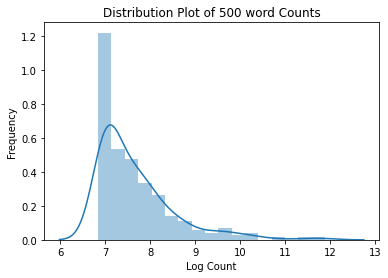

In [71]:
#Input: Bag of Words
tfidf_vector = TfidfVectorizer(stop_words='english', max_features = 240)
transformed = tfidf_vector.fit_transform(unstem_corpus)

displot(transformed)

In [72]:
word_list = tfidf_vector.get_feature_names()
count_list = transformed.toarray().sum(axis=0)
dic_count = dict(zip(word_list,count_list))
ranked_dic = dict(sorted(dic_count.items(), key=lambda item: item[1], reverse=True))
ranked_dic

/Users/ebeen94/envs/tensorflow/lib/python3.7/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


{'ukrainerussia': 145470.0,
 'ukraine': 96595.0,
 'russia': 46752.0,
 'war': 29476.0,
 'putin': 28512.0,
 'russian': 25096.0,
 'ukraineunderattack': 20960.0,
 'ukraineinvasion': 20878.0,
 'ukrainian': 16563.0,
 'ukrainewar': 15495.0,
 'russiaukraineconflict': 14952.0,
 'nato': 14033.0,
 'people': 13578.0,
 'ukrainerussiaconflict': 12975.0,
 'world': 11427.0,
 'kyiv': 10077.0,
 'ukrainerussiacrisis': 8682.0,
 'russiaukrainewar': 8539.0,
 'worldwar3': 8526.0,
 'amp': 7899.0,
 'president': 6665.0,
 'ukrainecrisis': 6662.0,
 'peace': 6477.0,
 'stop': 6468.0,
 'russianinvasion': 5981.0,
 'kiev': 5940.0,
 'like': 5758.0,
 'country': 5745.0,
 'ukrainerussiawar': 5330.0,
 'breaking': 5204.0,
 'military': 5073.0,
 'usa': 4841.0,
 'biden': 4763.0,
 'india': 4715.0,
 'ukraina': 4590.0,
 'ukraineconflict': 4546.0,
 'invasion': 4542.0,
 'time': 4353.0,
 'help': 4008.0,
 'want': 3834.0,
 'forces': 3781.0,
 'news': 3770.0,
 'wwiii': 3720.0,
 'stopwar': 3687.0,
 'right': 3667.0,
 'know': 3619.0,
 'zel

In [101]:
df_unstem = pd.DataFrame(list(zip(word_list,count_list)), columns = ['Freq_Word', 'Word_Count'])
df_unstem.to_csv('freq_words_unstem.csv')

# Word Freq with Tfidf Stem Corpus -English

/Users/ebeen94/envs/tensorflow/lib/python3.7/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


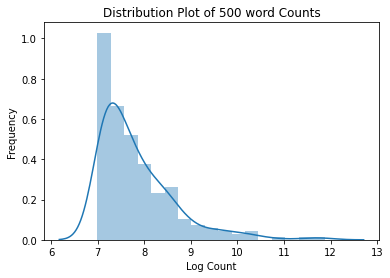

In [73]:
#Input: Bag of Words
tfidf_vector = TfidfVectorizer(stop_words='english', max_features = 240)
transformed_stem = tfidf_vector.fit_transform(stem_corpus)

displot(transformed_stem)

In [74]:
word_list_stem = tfidf_vector.get_feature_names()
count_list_stem = transformed.toarray().sum(axis=0)
dic_count_stem = dict(zip(word_list,count_list))
ranked_dic_stem = dict(sorted(dic_count.items(), key=lambda item: item[1], reverse=True))
ranked_dic_stem

/Users/ebeen94/envs/tensorflow/lib/python3.7/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


{'ukrainerussia': 145470.0,
 'ukraine': 96595.0,
 'russia': 46752.0,
 'war': 29476.0,
 'putin': 28512.0,
 'russian': 25096.0,
 'ukraineunderattack': 20960.0,
 'ukraineinvasion': 20878.0,
 'ukrainian': 16563.0,
 'ukrainewar': 15495.0,
 'russiaukraineconflict': 14952.0,
 'nato': 14033.0,
 'people': 13578.0,
 'ukrainerussiaconflict': 12975.0,
 'world': 11427.0,
 'kyiv': 10077.0,
 'ukrainerussiacrisis': 8682.0,
 'russiaukrainewar': 8539.0,
 'worldwar3': 8526.0,
 'amp': 7899.0,
 'president': 6665.0,
 'ukrainecrisis': 6662.0,
 'peace': 6477.0,
 'stop': 6468.0,
 'russianinvasion': 5981.0,
 'kiev': 5940.0,
 'like': 5758.0,
 'country': 5745.0,
 'ukrainerussiawar': 5330.0,
 'breaking': 5204.0,
 'military': 5073.0,
 'usa': 4841.0,
 'biden': 4763.0,
 'india': 4715.0,
 'ukraina': 4590.0,
 'ukraineconflict': 4546.0,
 'invasion': 4542.0,
 'time': 4353.0,
 'help': 4008.0,
 'want': 3834.0,
 'forces': 3781.0,
 'news': 3770.0,
 'wwiii': 3720.0,
 'stopwar': 3687.0,
 'right': 3667.0,
 'know': 3619.0,
 'zel

In [102]:
df_stem = pd.DataFrame(list(zip(word_list_stem,count_list_stem)), columns = ['Freq_Word', 'Word_Count'])
df_stem.to_csv('freq_words_stem.csv')

# NER Tagging with Unstem Corpus

In [75]:
from nltk.tag.stanford import StanfordNERTagger

PATH_TO_MODEL = '/Users/ebeen94/envs/tensorflow/lib/python3.7/site-packages/stanford_ner/classifiers/english.all.3class.distsim.crf.ser.gz'
PATH_TO_JAR = '/Users/ebeen94/envs/tensorflow/lib/python3.7/site-packages/stanford_ner/stanford-ner.jar'

In [186]:
with open('unstem_corpus.txt')as f:
    unstem_corpus = f.readlines()

In [76]:
unstem_corpus = [sent.strip() for sent in unstem_corpus]
unstem_corpus

['russiaukraineconflict',
 'live',
 'updates',
 'ukraine',
 'president',
 'calls',
 'europeans',
 'combat',
 'experience',
 'fight',
 'ukrainerussia',
 'crying',
 'ukraine',
 'home',
 'grandparents',
 'church',
 'grandmother',
 'village',
 'st',
 'michael',
 'ukrainerussia',
 'ukraineinvasion',
 'ukraineunderattack',
 'ukrainian',
 'ukrainewar',
 'ucraina',
 'world',
 'needs',
 'ukraineinvasion',
 'ukrainerussia',
 'ukraine',
 'war',
 'anything',
 'literally',
 'anything',
 'never',
 'asked',
 'ukrainerussia',
 'russianinvasion',
 'warinukraine',
 'like',
 'tired',
 'loons',
 'sides',
 'political',
 'divide',
 'feel',
 'free',
 'give',
 'follo4folloback',
 'followbackfriday',
 'guarantee',
 'get',
 'time',
 'get',
 'right',
 'time',
 'bring',
 'normalcy',
 'proceedings',
 'johnsonout32',
 'ukrainerussia',
 'ukrainian',
 'people',
 'would',
 'caught',
 'struggle',
 'war',
 'ability',
 'president',
 'understand',
 'situation',
 'world',
 'biden',
 'put',
 'nicely',
 'one',
 'actually',
 

In [77]:
#2,086,699
mini_unstem1 = unstem_corpus[:500000]
mini_unstem2 = unstem_corpus[500000:1000000]
mini_unstem3 = unstem_corpus[1000000:1500000]
mini_unstem4 = unstem_corpus[1500000:2000000]
mini_unstem5 = unstem_corpus[2000000:]

In [78]:
tagger = StanfordNERTagger(model_filename=PATH_TO_MODEL,path_to_jar=PATH_TO_JAR, encoding='utf-8')

tokenized_text = mini_unstem1
classified_text = tagger.tag(tokenized_text)
df1 = pd.DataFrame(classified_text)
df1.columns = ['Word', 'Label']
df1

,Word,Label
0,russiaukraineconflict,O
1,live,O
2,updates,O
3,ukraine,O
4,president,O
...,...,...
499995,kyiv,O
499996,hardest,O
499997,nickname,O
499998,ever,O


In [79]:
tokenized_text = mini_unstem2
classified_text = tagger.tag(tokenized_text)
df2 = pd.DataFrame(classified_text)
df2.columns = ['Word', 'Label']
df2

,Word,Label
0,pakistan,O
1,ordered,O
2,good,O
3,relationship,O
4,us,O
...,...,...
499995,industries,O
499996,economically,O
499997,punish,O
499998,country,O


In [80]:
tokenized_text = mini_unstem3
classified_text = tagger.tag(tokenized_text)
df3 = pd.DataFrame(classified_text)
df3.columns = ['Word', 'Label']
df3

,Word,Label
0,bourgeoisie,O
1,care,O
2,nothing,O
3,lives,O
4,working,O
...,...,...
499995,former,O
499996,spokesperson,O
499997,loud,O
499998,explosions,O


In [81]:
tokenized_text = mini_unstem4
classified_text = tagger.tag(tokenized_text)
df4 = pd.DataFrame(classified_text)
df4.columns = ['Word', 'Label']
df4

,Word,Label
0,kyiv,O
1,russian,O
2,troops,O
3,keep,O
4,bombardment,O
...,...,...
499995,emotional,O
499996,moment,O
499997,crisis,O
499998,ukrainerussia,O


In [82]:
tokenized_text = mini_unstem5
classified_text = tagger.tag(tokenized_text)
df5 = pd.DataFrame(classified_text)
df5.columns = ['Word', 'Label']
df5

,Word,Label
0,ukrainecrisis,O
1,ukraineinvasion,O
2,ukrainewar,O
3,ukrainian,O
4,forces,O
...,...,...
86694,writing,O
86695,commentary,O
86696,germany,O
86697,complicity,O


In [83]:
ner_tagged_df = pd.concat([df1, df2, df3, df4, df5], axis=0)

In [84]:
ner_tagged_df

,Word,Label
0,russiaukraineconflict,O
1,live,O
2,updates,O
3,ukraine,O
4,president,O
...,...,...
86694,writing,O
86695,commentary,O
86696,germany,O
86697,complicity,O


In [85]:
ner_tagged_df[ner_tagged_df['Label'] != 'O']

,Word,Label
104,ukraine,LOCATION
232,ukraine,LOCATION
279,russia,LOCATION
417,russia,LOCATION
608,kiev,LOCATION
...,...,...
86049,kiev,LOCATION
86152,afghanistan,LOCATION
86153,iraq,LOCATION
86421,america,LOCATION


In [87]:
set(ner_tagged_df.Label.values)

{'LOCATION', 'O', 'ORGANIZATION', 'PERSON'}

In [88]:
ner_tagged_df.to_csv('NER_tagged.csv')

# Sentiment Analysis with Cleaned Corpus

In [89]:
tweets

0         #RussiaUkraineConflict Live Updates: Ukraine's...
1         Crying for Ukraine, the home of my grandparent...
4         What the world needs now:   #UkraineInvasion #...
6         We are doing just anything literally anything....
11        If, like me, you’re tired of loons on both sid...
                                ...                        
156328    Wow, intense #Ukraina  combat I cannot imagine...
156330                              Pray for #UkraineRussia
156331    Putin is Trump 20 years in the making. #WWIII ...
156333    🕯️🕯️🕯️For all African leaders to just shut up ...
156336    Really have not seen enough writing or comment...
Name: tweet, Length: 144180, dtype: object

In [90]:
# example = ['Did you do your homework yesterday?!', '@#Do you love working with Python.  tooo?']
emo_text = [remove_urls(sent) for sent in tweets]
emo_text = [re.sub(r"[^a-z0-9]"," ",sent.lower()) for sent in emo_text]
emo_text = [sent.translate(str.maketrans('', '', string.punctuation)) for sent in emo_text]
emo_text = [s.split() for s in emo_text] 
emo_text = list(chain.from_iterable(emo_text))
emo_text = [word for word in emo_text if word not in stopwords.words('english')]

emo_text

['russiaukraineconflict',
 'live',
 'updates',
 'ukraine',
 'president',
 'calls',
 'europeans',
 'combat',
 'experience',
 'fight',
 'ukrainerussia',
 'crying',
 'ukraine',
 'home',
 'grandparents',
 'church',
 'grandmother',
 'village',
 'st',
 'michael',
 'ukrainerussia',
 'ukraineinvasion',
 'ukraineunderattack',
 'ukrainian',
 'ukrainewar',
 'ucraina',
 'world',
 'needs',
 'ukraineinvasion',
 'ukrainerussia',
 'ukraine',
 'war',
 'anything',
 'literally',
 'anything',
 'never',
 'asked',
 'ukrainerussia',
 'russianinvasion',
 'warinukraine',
 'like',
 'tired',
 'loons',
 'sides',
 'political',
 'divide',
 'feel',
 'free',
 'give',
 'follo4folloback',
 'followbackfriday',
 'guarantee',
 'get',
 'time',
 'get',
 'right',
 'time',
 'bring',
 'normalcy',
 'proceedings',
 'johnsonout32',
 'ukrainerussia',
 'ukrainian',
 'people',
 'would',
 'caught',
 'struggle',
 'war',
 'ability',
 'president',
 'understand',
 'situation',
 'world',
 'biden',
 'put',
 'nicely',
 'one',
 'actually',
 

In [91]:
from nltk.tokenize.treebank import TreebankWordDetokenizer
emo_joined = TreebankWordDetokenizer().detokenize(emo_text)
emo_joined

'russiaukraineconflict live updates ukraine president calls europeans combat experience fight ukrainerussia crying ukraine home grandparents church grandmother village st michael ukrainerussia ukraineinvasion ukraineunderattack ukrainian ukrainewar ucraina world needs ukraineinvasion ukrainerussia ukraine war anything literally anything never asked ukrainerussia russianinvasion warinukraine like tired loons sides political divide feel free give follo4folloback followbackfriday guarantee get time get right time bring normalcy proceedings johnsonout32 ukrainerussia ukrainian people would caught struggle war ability president understand situation world biden put nicely one actually helped ukrainerussia really want go ukraine fight freedom democracy protect europe right flank russian aggression father also need provide young daughter mum ukrainerussia america responsible war ukraine people facing today indians pray peace earliest ukraineunderattack ukrainerussia ukraineinvasion ukraine ukr

# Vader
- positive: compound score>=0.05
- neutral: compound score between -0.05 and 0.05
- negative: compound score<=-0.05

- pos: The probability of the sentiment to be positive
- neu: The probability of the sentiment to be neutral
- neg: The probability of the sentiment to be negative
- compound: The normalized compound score which calculates the sum of all - lexicon ratings and takes values from -1 to 1

In [92]:
from nltk.sentiment.vader import SentimentIntensityAnalyzer

In [93]:
score = SentimentIntensityAnalyzer().polarity_scores(emo_joined)
print(score)

{'neg': 0.177, 'neu': 0.683, 'pos': 0.14, 'compound': -1.0}


# Empath

In [94]:
from empath import Empath
lexicon = Empath()

In [95]:
empath_dic = lexicon.analyze(emo_joined, normalize=True)

In [96]:
ranked_dic_emo = dict(sorted(empath_dic.items(), key=lambda item: item[1], reverse=True))
ranked_dic_emo

{'war': 0.03433530488056181,
 'fight': 0.030103235465230513,
 'death': 0.02028527531214567,
 'negative_emotion': 0.019076181083306255,
 'military': 0.014231178049788037,
 'leader': 0.010459647498473655,
 'government': 0.009302309978597642,
 'weapon': 0.009140809877480368,
 'power': 0.00906796710190225,
 'terrorism': 0.008784742888963649,
 'positive_emotion': 0.008651038057474867,
 'speaking': 0.008543690809254482,
 'kill': 0.007709832720399715,
 'communication': 0.007663347528089995,
 'aggression': 0.007582837091924708,
 'strength': 0.007523412722374138,
 'dispute': 0.007466863725543757,
 'violence': 0.007345618842509127,
 'giving': 0.006815112575634283,
 'help': 0.006761438951524091,
 'breaking': 0.006730289080388712,
 'trust': 0.006675656998705124,
 'suffering': 0.006070870269892068,
 'injury': 0.005996589807953856,
 'dominant_heirarchical': 0.005995152121593761,
 'business': 0.005956334589871212,
 'messaging': 0.005533175571216752,
 'social_media': 0.005465125083505616,
 'law': 0.00

In [97]:
empath_name = ranked_dic_emo.keys()
empath_score = ranked_dic_emo.values()

In [98]:
emo_df = pd.DataFrame(list(zip(empath_name, empath_score)), columns = ['empath_name', 'empath_score'])
emo_df

,empath_name,empath_score
0,war,0.034335
1,fight,0.030103
2,death,0.020285
3,negative_emotion,0.019076
4,military,0.014231
...,...,...
189,hygiene,0.000386
190,medieval,0.000386
191,farming,0.000313
192,anticipation,0.000295


In [99]:
emo_df.to_csv('empath_scores.csv')